### Тестове завдання
### Задача 1
#### Виконав Михайлов Валерій

# Проаналізуємо дані.

### 1) Спочатку завантажемо дані.

In [2]:
import pandas as pd


# Uploading CSV files
directory = 'S_Data'

sellers = pd.read_csv(f'{directory}/sellers.csv')
products = pd.read_csv(f'{directory}/products.csv')
product_category_name_translation = pd.read_csv(f'{directory}/product_category_name_translation.csv')
orders = pd.read_csv(f'{directory}/orders.csv')
order_reviews = pd.read_csv(f'{directory}/order_reviews.csv')
order_payments = pd.read_csv(f'{directory}/order_payments.csv')
order_items = pd.read_csv(f'{directory}/order_items.csv')
geolocation = pd.read_csv(f'{directory}/geolocation.csv')
customers = pd.read_csv(f'{directory}/customers.csv')

### 2. Підготуємо дані, об'єднавши необхідні в одну таблицю.

In [3]:
# order id & timestamp & category

# we consider approved orders 
data = pd.merge(orders[orders['order_approved_at'].notna()], order_items, on='order_id', how='left')
data = pd.merge(data, products, on='product_id')
# we consider products with known category
data = pd.merge(data, product_category_name_translation, on='product_category_name')

data['order_purchase_timestamp'] = pd.to_datetime(data['order_purchase_timestamp'])


data = data[['order_id', 'order_purchase_timestamp', 
             'product_category_name_english', 'order_item_id']]

За допомогою data-wrangler проаналізуємо наші дані:  
- в таблиці order_items є повтори order_id через те, що в одному замовленні може бути декілька товарів, 
тому в нашій результуючій таблиці також будуть повтори.
- у 610 з 32951 продуктів немає назви категорії до якої вони належать, що призвело до того,
що 1698 з 97229 замовлень не можна віднести до якоїсь категорії. Втрата такої кількості даних є допустимою.
- я прийняв рішення не розглядати непідтвердженні замовлення з таблиці orders, бо вони не збільшують попит.

### 3. Тепер намалюємо графік загального попиту товарів протягом усього часу і першої та осанньої чверті.

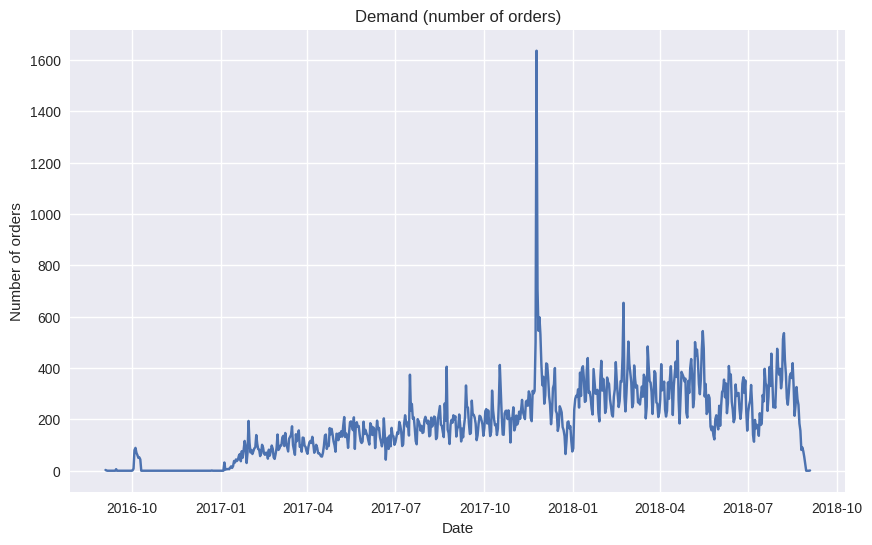

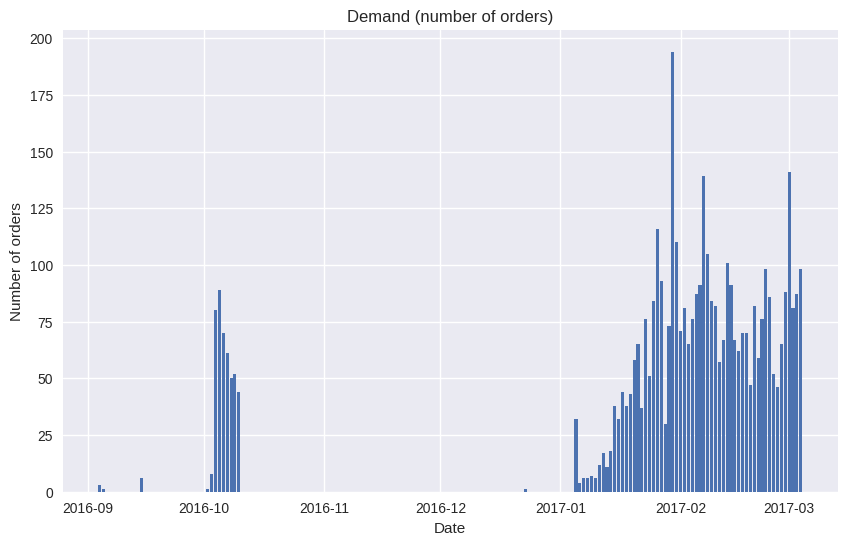

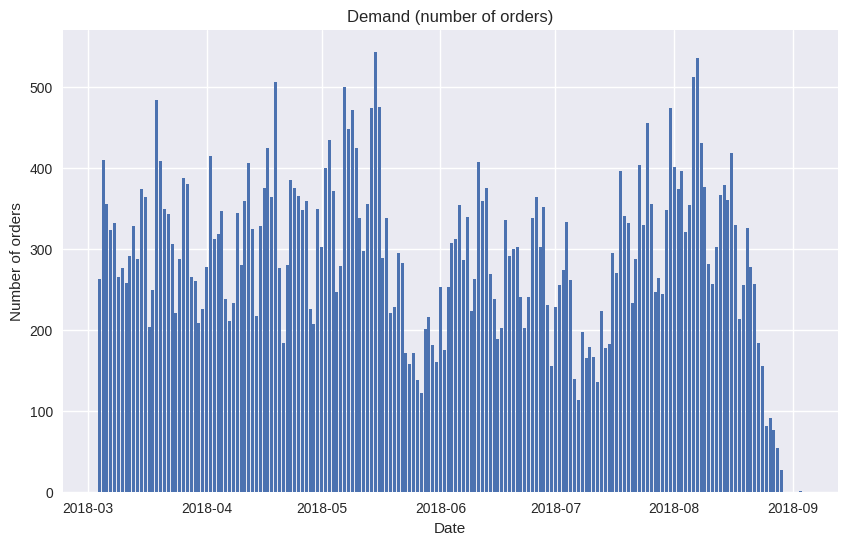

In [4]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8')


general_data = data.set_index('order_purchase_timestamp')
general_data = general_data.resample('D')\
    .agg({'order_item_id': 'sum'})\
    .rename(columns={'order_item_id': 'order_count'})
general_data = general_data.asfreq('D', fill_value=0)



# for all time
plt.figure(figsize=(10, 6))
plt.plot(general_data.index, general_data['order_count'])
plt.title(f'Demand (number of orders)')
plt.xlabel('Date')
plt.ylabel('Number of orders')

quarter_length = int(0.25*((general_data.index.max() - general_data.index.min()).days))

# first quarter
plt.figure(figsize=(10, 6))
plt.bar(general_data.index[:quarter_length], general_data['order_count'][:quarter_length])
plt.title(f'Demand (number of orders)')
plt.xlabel('Date')
plt.ylabel('Number of orders')

# last quarter
plt.figure(figsize=(10, 6))
plt.bar(general_data.index[3*quarter_length:], general_data['order_count'][3*quarter_length:])
plt.title(f'Demand (number of orders)')
plt.xlabel('Date')
plt.ylabel('Number of orders')

plt.show()

### 4. Вибір часового проміжка
- Можна побачити, що дані про продажі на початку відсутні, бо їх або не збирали, або їх не було. 
Це буде негативно впливати на розуміння ситуації моделлю, тому видалемо дані до 2017-01-10.
- Також дані за останній 10 днів продажів майже не було, що виглядає досить дивним,
скоріше за все, дані додають в БД, коли товар вже отримали, що може займати певний час. Ще про 
неконсистентність даних свідчить те, що останній коментар був залишений 2018-08-31.

Отже, справжній попит за цей тиждень різниться з нашими даними, тому для корректності відпрацювання моделі, 
видалемо дані після 2018-08-29.

In [5]:
data = data[(data['order_purchase_timestamp'] > '2017-01-10') & (data['order_purchase_timestamp'] <= '2018-08-29')]
data.set_index('order_purchase_timestamp', inplace=True)

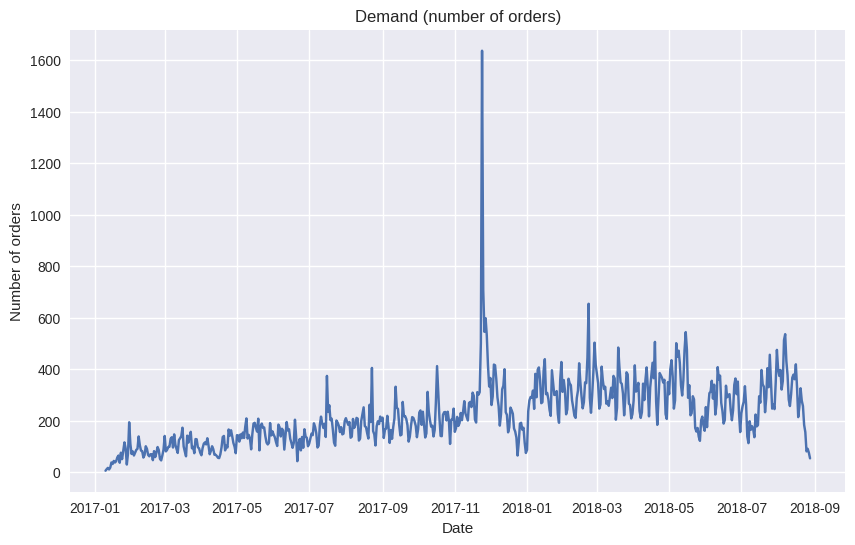

In [6]:
general_data = data.resample('D').agg({'order_item_id': 'sum'}).rename(columns={'order_item_id': 'order_count'})
general_data = general_data.asfreq('D', fill_value=0)


# for all time
plt.figure(figsize=(10, 6))
plt.plot(general_data.index, general_data['order_count'])
plt.title(f'Demand (number of orders)')
plt.xlabel('Date')
plt.ylabel('Number of orders')

plt.show()

Тепер графік загального попиту виглядає досить природньо.

### 5. Проаналізуємо категорії.

Спочатку виведемо графіки попиту для всіх категорій, у яких ненульові продажі.

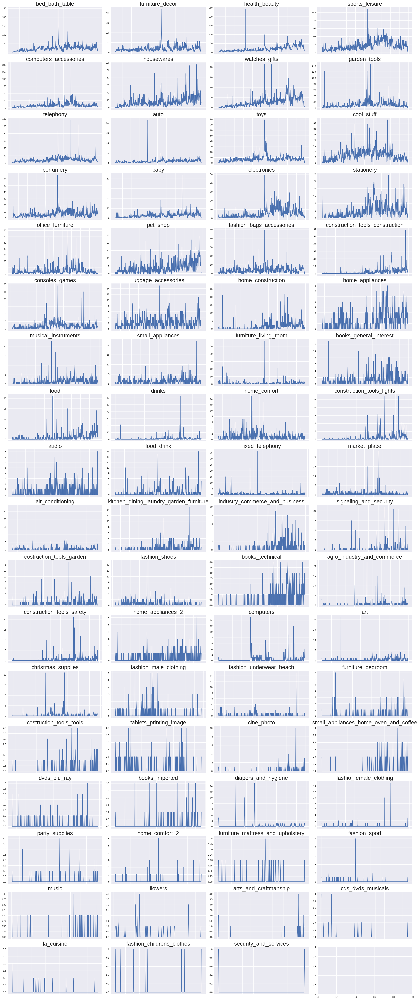

In [7]:
sorted_categories = data.groupby('product_category_name_english')['order_item_id'].sum().sort_values(ascending=False).index.to_list()
fig, axs = plt.subplots(18,4,figsize=(25,60))
for i in range(18):
    for j in range(4):
        if i*4+j+1>len(sorted_categories):
            break
        category = sorted_categories[4*i+j]
        category_data = data[data['product_category_name_english'] == category].resample('D').agg({'order_item_id': 'sum'}).rename(columns={'order_item_id': 'order_count'})
        category_data = category_data.asfreq('D', fill_value=0)
        axs[i, j].plot(category_data.index, category_data['order_count'])
        axs[i, j].set_title(category, fontsize=24)
        axs[i, j].set_xticklabels([])
        
plt.tight_layout()
plt.show()

Виведемо кількість категорій з ненульовим попитом.

In [8]:
print(len(sorted_categories))

71


# Почнемо будувати моделі:
## Класична модель для TSA.

Зрозуміло, що важко буде окремо проаналізувати кожний часовий ряд, через їхню кількість. Але ми можемо помітити, що деякі категорії ведуть себе досить 
схоже: bed_bath_table - furniture_decor - sports_leisure, housewares - watches_gifts тощо. Тому можно прокластерезувати наші ряді в 
невелику кількість кластерів, враховуючи їхні статистичні особливості, потім проаналізувати усереднені значення цих рядів і побудувати для 
них моделі. Якщо правильно прокластерезувати, то це має дати гарні результати.

Використання архітектури nested forecasting вважаю недоречним, оскільки
середня кількість продажів товару - 4.

Є сенс кластерезувати категорії, у яких наявні значущі статистичні характеристики, бо якщо продажів в категорії
надто мало, то ознак по яким їх можна об'єднати не буде. Тому я вирішив відкинути усі категорії з загальною кількістью продажів меншою
за 500 товарів за 592 дня спостережень, тобто усі категорії після "food".

Для обраних категорій я застосовую метод лінійної регресії до даних за останній рік. Отриманий прогноз відображає середнє значення і враховує динаміку змін. Це не є найкращим короткостроковим прогнозом, можна ще дослідити прив'язку попиту на конкретні категорії до конкретних дат, наприклад, до Нового Року, чи канцелярських товарів до початку навчального року, але це треба досліджувати кожну категорію окремо, що важко зробити самостійно.

### 1. Прогноз для товарів з низьким попитом.
Остання дата в даних - 2018-09-03, нам треба прогноз на 3 тижні, тому прогнозувати будемо до 2018-09-03 включно. Ми працюємо з даними до
2018-08-29 включно, отже, прогноз треба зробити на 26 днів.
Щоб було легче розуміти дані, я виведу їх лише за останні 100 днів.

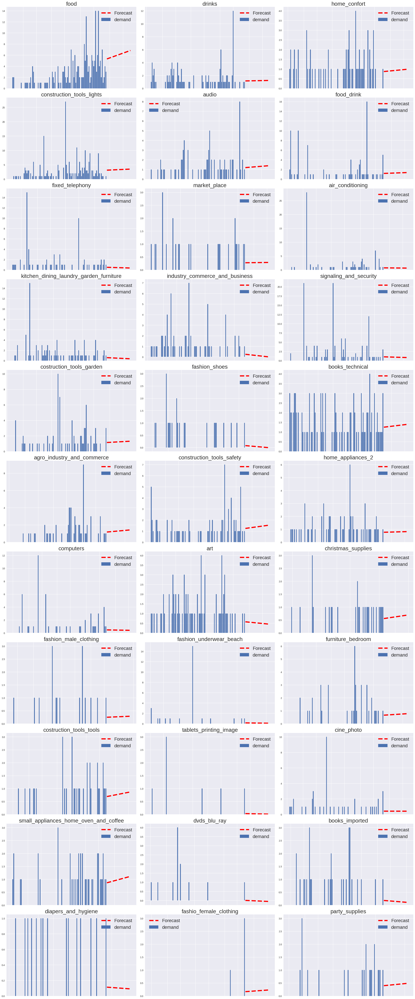

In [9]:
from sklearn.linear_model import LinearRegression


unpopular_categories = sorted_categories[sorted_categories.index('food'):]
fig, axs = plt.subplots(11,3,figsize=(25,60))
for i in range(11):
    for j in range(3):
        if i*3+j+1>len(unpopular_categories):
            break

        # plotting data
        category = unpopular_categories[3*i+j]
        category_data = data[data['product_category_name_english'] == category].resample('D').agg({'order_item_id': 'sum'}).rename(columns={'order_item_id': 'order_count'})
        category_data = category_data.asfreq('D', fill_value=0)
        axs[i, j].bar(category_data.index[-100:], category_data['order_count'][-100:], label='demand')

        # plotting forecast
        last_two_months  = category_data.loc[category_data.index[-1] - pd.Timedelta(days=90):]

        # data for linear regression
        X = (last_two_months.index - last_two_months.index[0]).days.values.reshape(-1, 1)
        y = last_two_months['order_count'].values
        # linear regression model
        model = LinearRegression()
        model.fit(X, y)
        # 
        forecast_index = pd.date_range(start=category_data.index[-1] + pd.Timedelta(days=1), periods=26, freq='D')
        X_forecast = (forecast_index - last_two_months.index[0]).days.values.reshape(-1, 1)
        y_forecast = model.predict(X_forecast)

        forecast = pd.DataFrame({'order_count': y_forecast}, index=forecast_index)
        axs[i, j].plot(forecast.index, forecast['order_count'], label='Forecast', ls='--', c='r', linewidth=5)


        axs[i, j].set_title(category, fontsize=24)
        axs[i, j].set_xticklabels([])
        axs[i, j].legend(fontsize=20)
        
plt.tight_layout()

plt.show()

### 2. Я маю ідею 
- прокластерезувати ряди зі схожими статистичними характеристиками, 
- потім усереднити їх, 
- потім проаналізуємо ці ряди визначивши параметри (p, q, d та сезонність) для SARIMA, 
- і потім автоматично навчимо для кожного ряду з кластеру модель SARIMAX з підібраними гіперпараметрами.

DTW метрика є гарним вибором для кластеризації часових рядів, оскільки вона враховує тимчасові зсуви і розтягування, зберігає глобальну структуру даних і є менш чутливою до шуму. Це особливо важливо для нашого завдання, що вимагає визначення параметрів SARIMA, оскільки схожі патерни в рядах призводять до схожих параметрів моделі.

In [10]:
# merging data by categories
category_data = data.groupby(['product_category_name_english', pd.Grouper(freq='D')]).size().unstack(fill_value=0)
# we consider only popular categories now
category_data = category_data.loc[category_data.sum(axis=1)[category_data.sum(axis=1) > 500].index]

Підготуємо ряди до кластеризації.

In [11]:
from sklearn.preprocessing import StandardScaler


normalized_data = StandardScaler().fit_transform(category_data.T).T

Обрахуємо матрицю метрики DTW.

In [12]:
from dtaidistance import dtw # type: ignore
import numpy as np

# calculation of DTW
distance_matrix = np.zeros((normalized_data.shape[0], normalized_data.shape[0]))
for i in range(len(normalized_data)):
    for j in range(i, len(normalized_data)):
        distance = dtw.distance(normalized_data[i], normalized_data[j])
        distance_matrix[i, j] = distance
        distance_matrix[j, i] = distance

Тепер проведемо кластеризацію на основі цієї метрики.

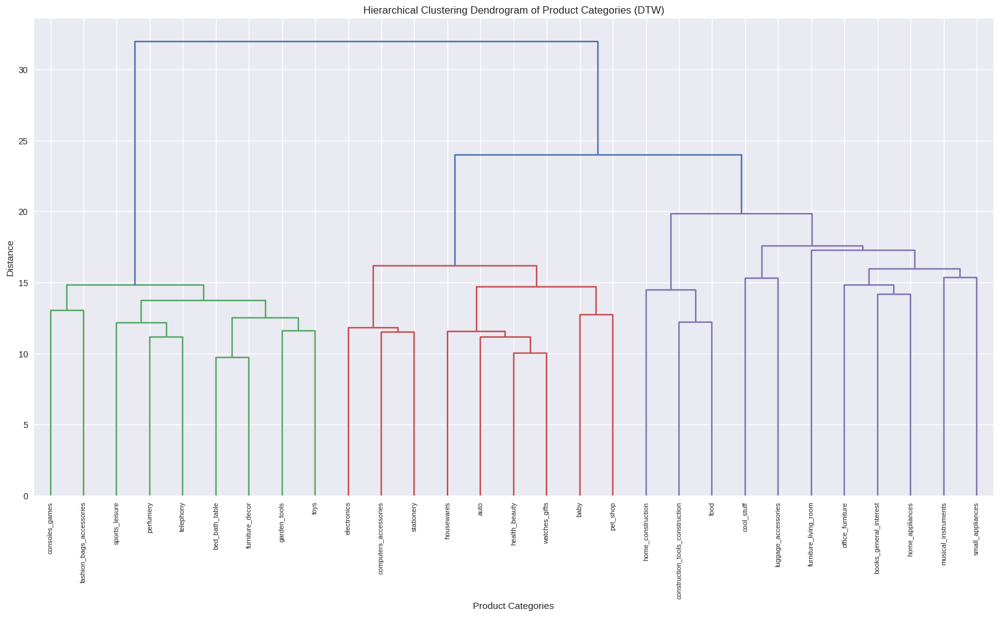

In [13]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import squareform


# AgglomerativeClustering
clf = AgglomerativeClustering(n_clusters=None, distance_threshold=0)
clf = clf.fit(normalized_data)


# performing hierarchical clustering
linkage_matrix = linkage(squareform(distance_matrix), method='ward')


plt.figure(figsize=(20, 10))
dendrogram(linkage_matrix, 
           labels=category_data.index, 
           leaf_rotation=90, 
           leaf_font_size=8)

plt.title('Hierarchical Clustering Dendrogram of Product Categories (DTW)')
plt.xlabel('Product Categories')
plt.ylabel('Distance')
plt.show()

Для мене це виглядає так, що оптимальною кількістю кластерів є лише 3 кластери, бо якщо б ми провели лінію в точках y=21 та y=23, що є найдовшою вертикальною відстанню, де ми б не перетнулись з іншими кластерами.

In [14]:
from scipy.cluster.hierarchy import fcluster


clusters = fcluster(linkage_matrix, 23, criterion='distance')

Для усереднення по кластерам просто візьмемо арифметичне середнє, думаю, що використання DBA буде зайвим, бо в нас схожі ряди мають схожі 
паттерни у однакові проміжки, тому DBA не покращить перформанс. 

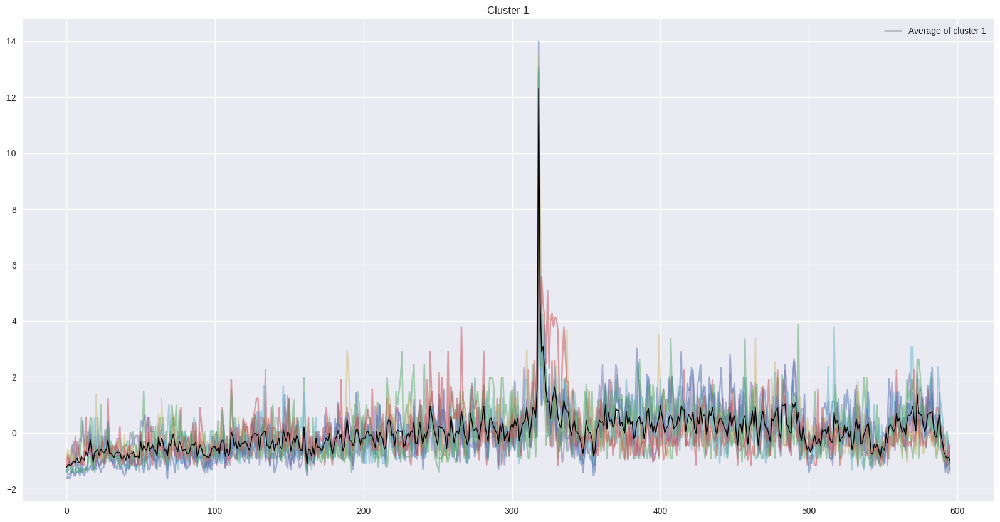

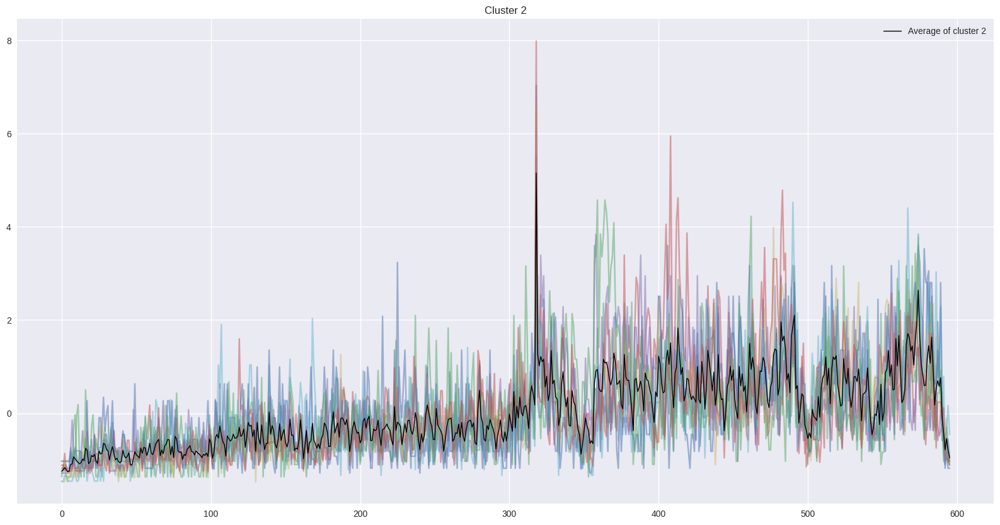

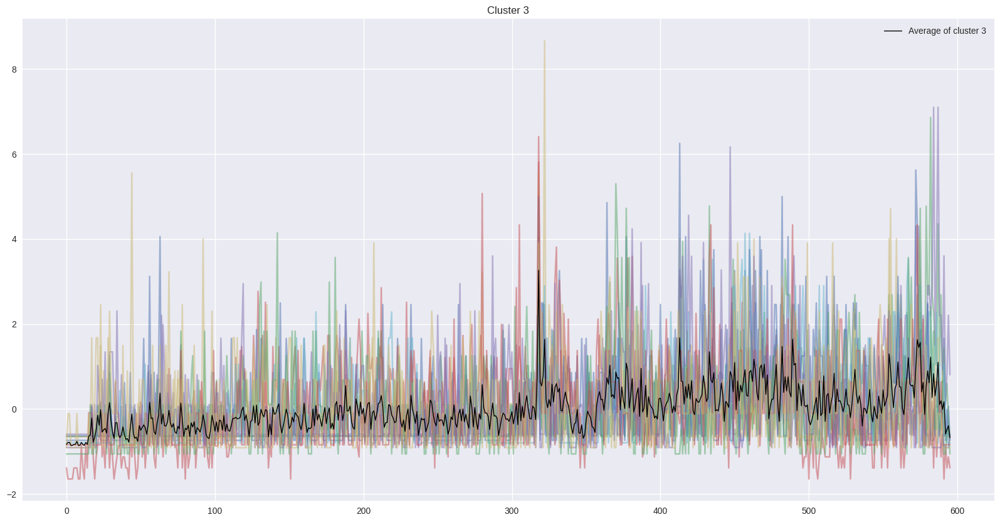

In [15]:
avg_series = {}
for cluster in np.unique(clusters):
    plt.figure(figsize=(20, 10))
    for series, label in zip(normalized_data, clusters):
        if label == cluster:
            # plotting ts from cluster
            plt.plot(series, alpha=0.5)

    # plotting cluster average
    avg = np.mean(normalized_data[clusters == cluster], axis=0)
    avg_series[cluster] = avg

    plt.plot(avg, c='black', linewidth=1, label=f'Average of cluster {cluster}')


    plt.title(f'Cluster {cluster}')
    plt.legend()
    plt.show()

plt.show()

Візуально, розділення вийшло непогане: 
- у першому кластері товари, які продаються стабільно протягом року, маючи значний пік на Новий Рік,
- у другому кластері більш виражена сезонність та зростаючий тренд,
- в третій кластер попали ряди з великою кількістю піків, які було важко віднести до двох перших кластерів, тому цей 
кластер наврядчи сильно інформативний.

Подивимося на категорії в кожному кластері.

In [16]:
# сreate a DataFrame with cluster labels
cluster_df = pd.DataFrame({'Category': category_data.index, 'Cluster': clusters})
cluster_df = cluster_df.sort_values('Cluster')

for cluster in range(1, 4):
    print(f"Cluster {cluster}:")
    categories = cluster_df[cluster_df['Cluster'] == cluster]['Category'].tolist()
    for category in categories:
        print(f"  - {category}")
    print()

Cluster 1:
  - telephony
  - bed_bath_table
  - sports_leisure
  - consoles_games
  - perfumery
  - fashion_bags_accessories
  - toys
  - furniture_decor
  - garden_tools

Cluster 2:
  - auto
  - stationery
  - pet_shop
  - housewares
  - health_beauty
  - electronics
  - computers_accessories
  - baby
  - watches_gifts

Cluster 3:
  - food
  - home_appliances
  - home_construction
  - luggage_accessories
  - musical_instruments
  - office_furniture
  - cool_stuff
  - construction_tools_construction
  - small_appliances
  - books_general_interest
  - furniture_living_room



### 3. Тепер перейдемо до статистично аналізу кожного ряду.

#### 3.1 
Я хочу з усереднених рядів отримати основні статистичні характеристики, тому зараз мене не цікавлять екстримальні значення (при навчанні моделей для кожного окремого ряду, я використаю регрессори для зовнішніх змінних, які 
в цьому випадку, будуть індикаторами свят в країні, в якій працює цей маркет-плейс, тому відслідковування таких 
значень буде на останньому етапі) та виконаю експоненційне згладжування.

Приберемо екстремальні значення в кожному ряду з допомогою IQR.

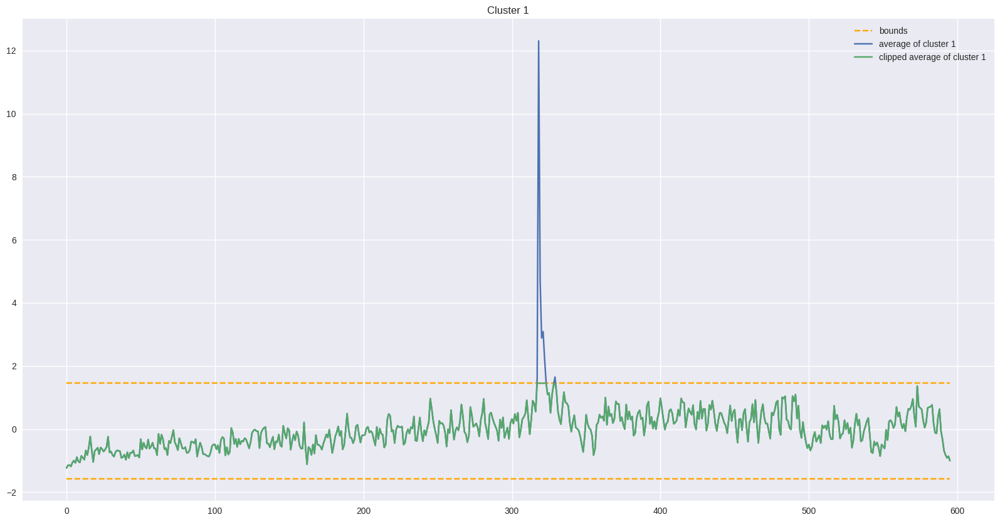

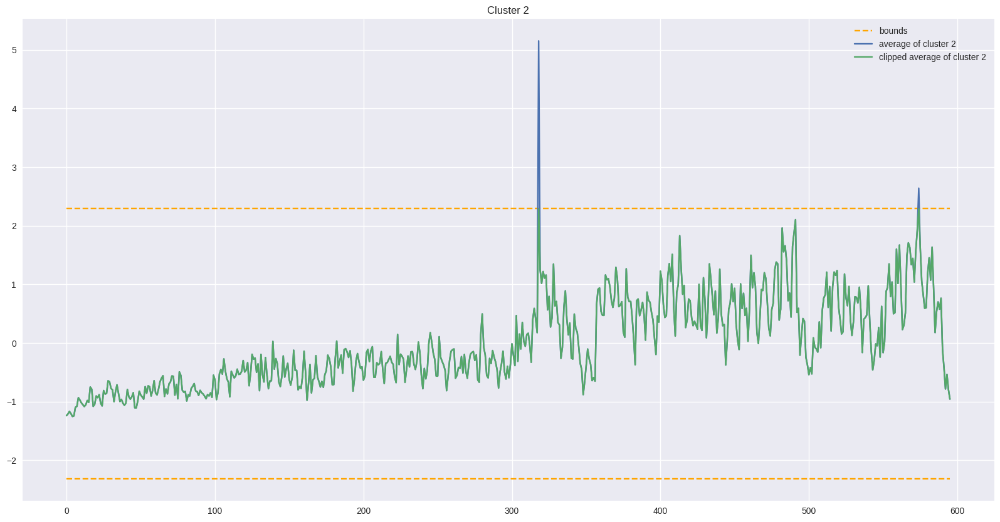

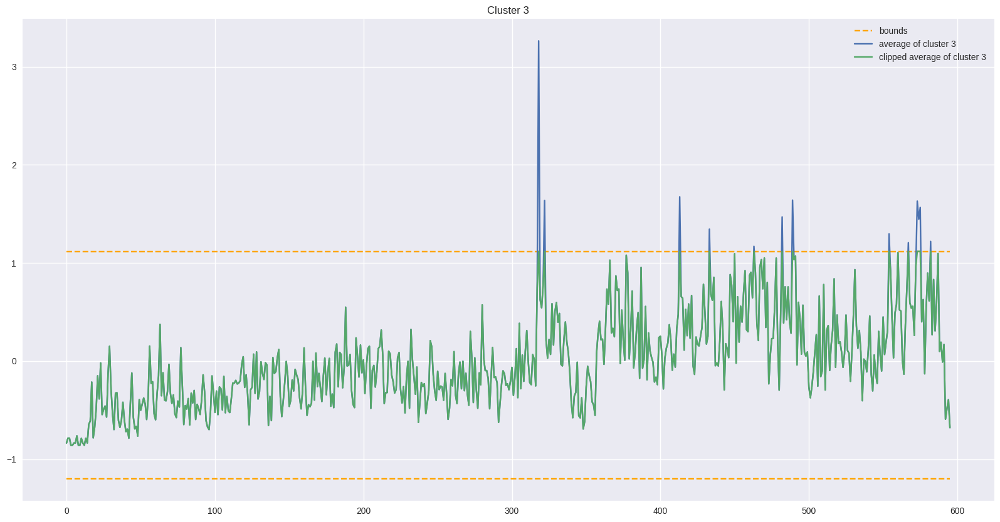

In [17]:
clipped_avg_series = avg_series.copy()

for cluster in np.unique(clusters):
    series = avg_series[cluster]
    
    Q1 = np.percentile(series, 25)
    Q3 = np.percentile(series, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    clipped_avg_series[cluster] = np.clip(series, lower_bound, upper_bound)


    plt.figure(figsize=(20, 10))
    plt.plot(range(series.shape[0]), lower_bound*np.ones(series.shape[0]), linestyle='--', label='bounds', c='orange')
    plt.plot(range(series.shape[0]), upper_bound*np.ones(series.shape[0]), linestyle='--', c='orange')

    # plotting average
    plt.plot(series, label=f'average of cluster {cluster}')

    # plotting clipped average
    plt.plot(clipped_avg_series[cluster], label=f'clipped average of cluster {cluster}')
    plt.title(f'Cluster {cluster}')
    plt.legend()
    plt.show()  

Тепер зробимо експоненційне згладжування з досить низьким коефіцієнтом, щоб отримати більш прості ряди.

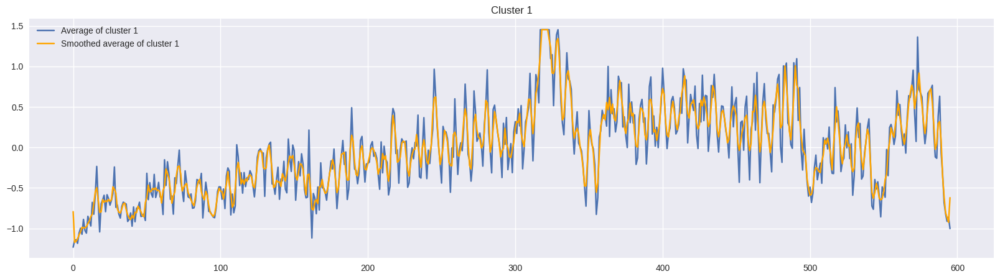

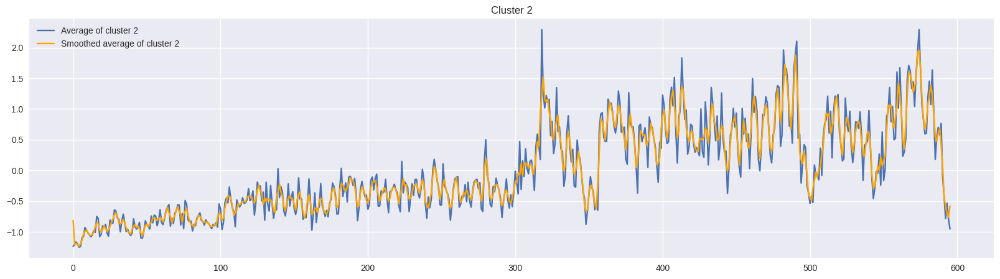

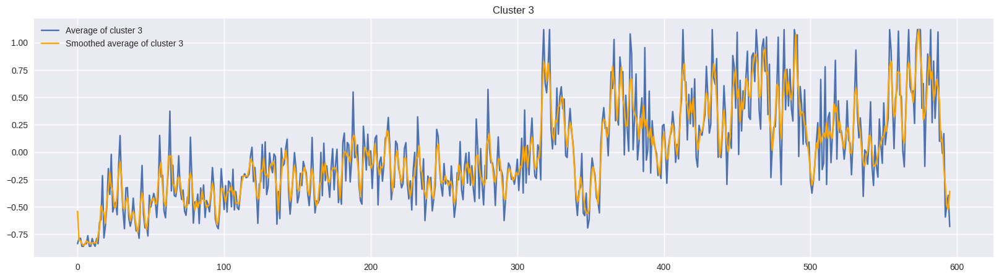

In [18]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing


mov_cl_avg = clipped_avg_series.copy()
for cluster in np.unique(clusters):
    series = clipped_avg_series[cluster]
    mov_cl_avg[cluster] = np.convolve(series, np.ones(3) / 3, mode='same')

    plt.figure(figsize=(20, 5))

    plt.plot(series, label=f'Average of cluster {cluster}')

    plt.plot(mov_cl_avg[cluster], label=f'Smoothed average of cluster {cluster}', c='orange')
    plt.title(f'Cluster {cluster}')
    plt.legend()
    plt.show()  

#### 3.2 Проведемо оцінку на стаціонарність за допомогою теста KPSS.

In [19]:
from statsmodels.tsa.stattools import kpss


for cluster in np.unique(clusters):
    result = kpss(mov_cl_avg[cluster])
    print(f'{cluster} cluster')
    print("KPSS statisctics: ", result[0])
    print("p-value: ", result[1])
    print("Critical values: ", result[3])
    print('-------------------------------------------------------------------------')

1 cluster
KPSS statisctics:  2.093357783326326
p-value:  0.01
Critical values:  {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
-------------------------------------------------------------------------
2 cluster
KPSS statisctics:  3.1511021870966105
p-value:  0.01
Critical values:  {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
-------------------------------------------------------------------------
3 cluster
KPSS statisctics:  2.815365763665357
p-value:  0.01
Critical values:  {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
-------------------------------------------------------------------------


/tmp/ipykernel_110178/848395956.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(mov_cl_avg[cluster])
/tmp/ipykernel_110178/848395956.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(mov_cl_avg[cluster])
/tmp/ipykernel_110178/848395956.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(mov_cl_avg[cluster])


Значення статистик дуже низькі, тому ми з впевненістю, яка виходить за межі тесту, відхиляємо 0 гіпотезу про стаціонарність 
рядів і надалі будемо використовувати підходи, які не передбачають стаціонарності.

#### 3.3 Спробуємо підібрати тепер параметри для моделі SARIMA за допомогою перебору. 
Якість моделі будемо оцінювати за
допомогою інформаційного критерію Акайке.

In [20]:
from pmdarima.arima import auto_arima # type: ignore


models = {}
for cluster in np.unique(clusters):
    models[cluster] = auto_arima(mov_cl_avg[cluster], seasonal=True, m=7)

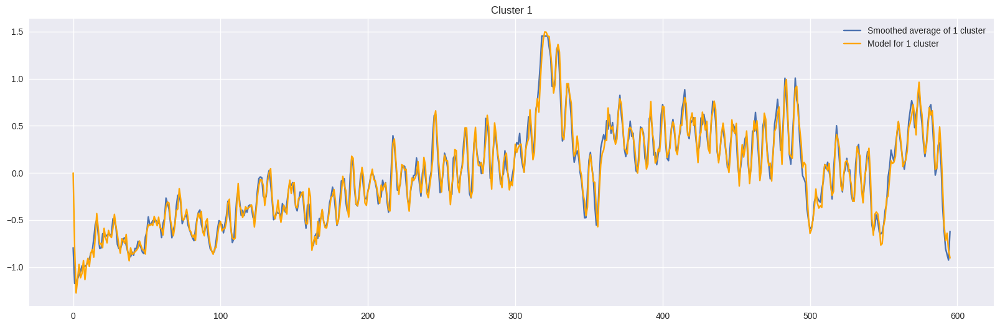

R^2 =  0.9597242297822908
MSE =  0.009810711195108275


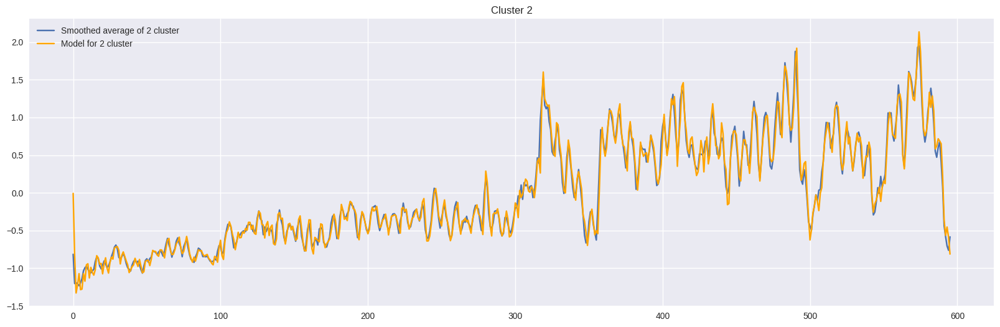

R^2 =  0.9768953184706533
MSE =  0.011187898441378371


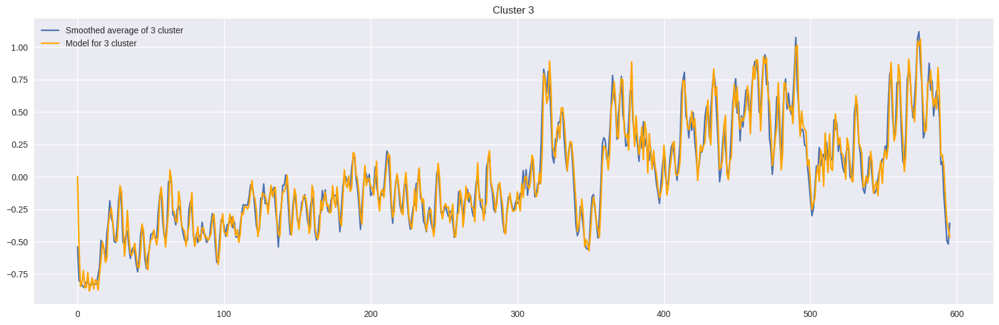

R^2 =  0.9349150221756075
MSE =  0.010441143403532312


In [21]:
from sklearn.metrics import r2_score, mean_squared_error


for cluster in np.unique(clusters):
    series = mov_cl_avg[cluster]
    prediction = models[cluster].predict_in_sample()

    plt.figure(figsize=(20, 6))

    plt.plot(series, label=f'Smoothed average of {cluster} cluster')
    plt.plot(prediction, label=f'Model for {cluster} cluster', c='orange')
    
    plt.title(f'Cluster {cluster}')
    plt.legend()
    plt.show()  
    
    # metrics
    print("R^2 = ", r2_score(series, prediction))
    print("MSE = ", mean_squared_error(series, prediction))


Подивимось на інші характеристики моделі.

In [22]:
for cluster in np.unique(clusters):
    print(f"***MODEL FOR {cluster} CLUSTER***\n")
    print(models[cluster].summary())
    print()

***MODEL FOR 1 CLUSTER***

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  596
Model:             SARIMAX(4, 1, 3)x(2, 0, [1, 2], 7)   Log Likelihood                 567.141
Date:                                Sat, 27 Jul 2024   AIC                          -1108.282
Time:                                        03:47:07   BIC                          -1051.231
Sample:                                             0   HQIC                         -1086.065
                                                - 596                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -2.057e-05      0.000     -0.070      0.944 

Судячи по метрикам та візуально, моделі непогано розпізнали кластерні ряди, що, мабуть, призведе до непоганих результатів для конкретних категорій.

### 4. Тепер, використовуючи отримані гіперпарамери, спробуємо побудувати моделі для кожної категорії. 
Також врахуємо деякі події: new_year, christmas, black_friday, cyber_monday, valentines_day за допомогою вбудованих регрессорів. Звісно, цей 
список можно сильно розширити при детальному аналізі категорій та звичаїв в Латинській Америці.

In [23]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from holidays import holidays, add_holiday


# add rows with indicators
category_data = add_holiday(category_data)

# create model for given data and cluster
def create_model_for_category(data, cluster, category_data):

    cluster_model = models[cluster]
    
    model = SARIMAX(data, exog=category_data.transpose().loc[:,[*list(holidays.keys())]], 
                    order=cluster_model.order, seasonal_order=cluster_model.seasonal_order)
    
    results = model.fit(full_output=False, disp=False)
    return results

In [24]:
category_models = {}
for index, row in cluster_df.iterrows():
    category = row['Category']
    cluster = row['Cluster']
    model = create_model_for_category(category_data.loc[category], cluster, category_data)
    category_models[category] = model

/home/pil00pa/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/home/pil00pa/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/pil00pa/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


In [25]:
# adding model to cluster_df
cluster_df['Model'] = cluster_df['Category'].map(category_models)

Моделі вже готові, залишилось перевірити чи будуть вони гарно апроксимувати наш ряд, та 
чи не сильно ми втратили якісь статистичні характеристики рядів. Ми це зробимо за допомогою 
критерія Дарбіна-Уатсона. Точність апроксимації перевіримо за допомогою R2.

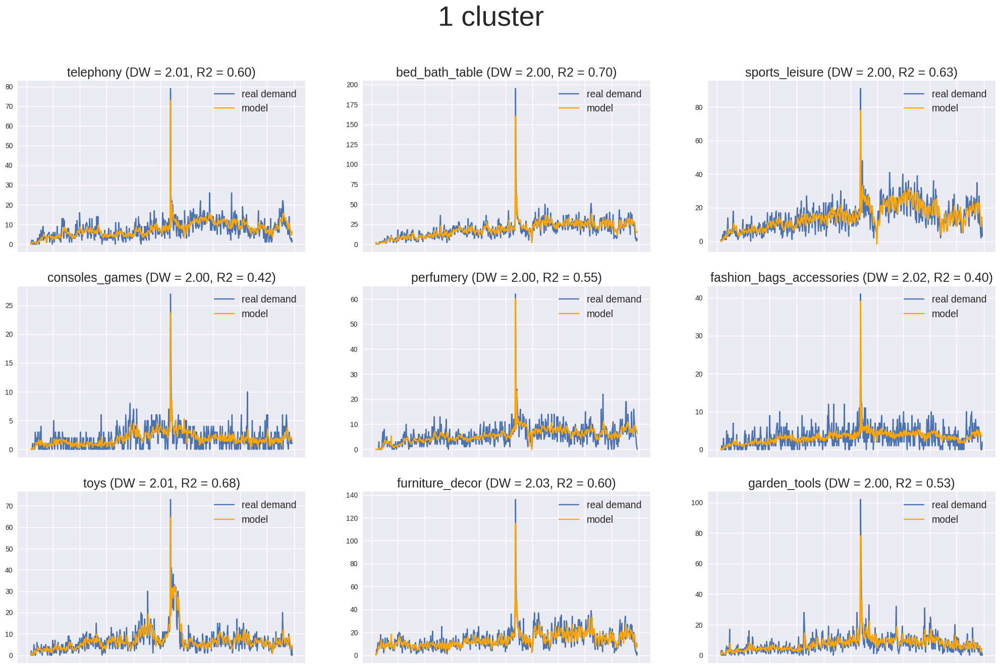

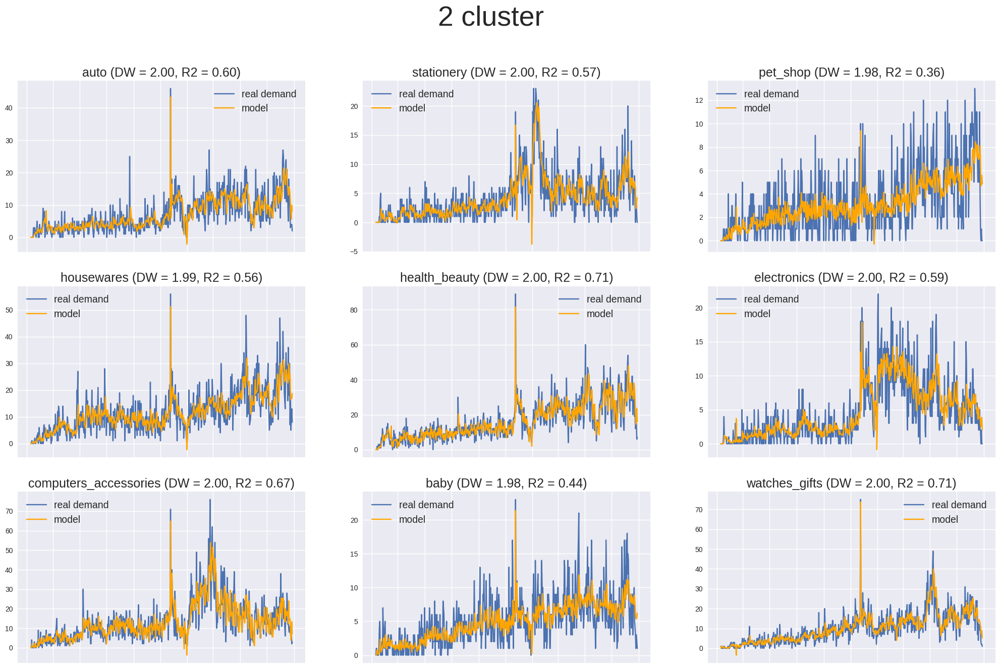

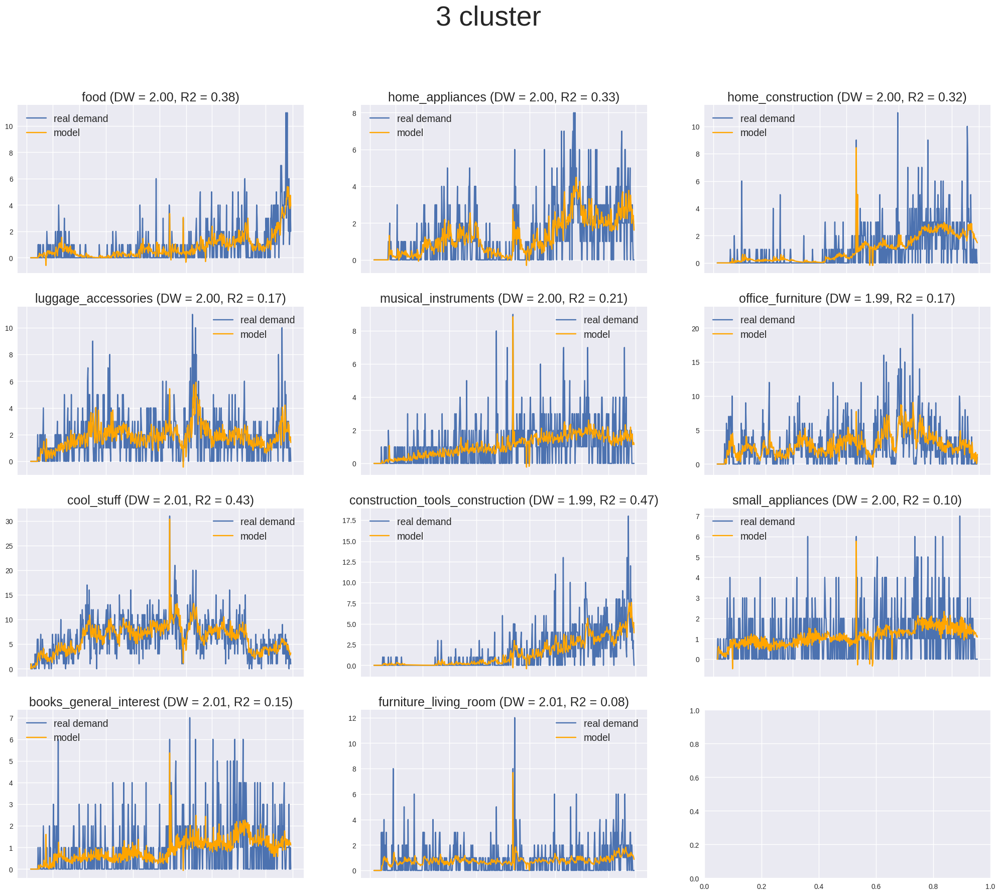

In [26]:
from math import floor, ceil
from statsmodels.stats.stattools import durbin_watson


for cluster in np.unique(clusters):
    cluster_categories = cluster_df[cluster_df['Cluster'] == cluster]['Category'].to_list()
    page_l = ceil(len(cluster_categories) / 3)

    fig, axs = plt.subplots(page_l, 3, figsize=(25,page_l*5))
    fig.suptitle(f"{cluster} cluster", fontsize=40)
    for i in range(page_l):
        for j in range(3):
            if i*3+j >= len(cluster_categories):
                break
            # plotting real demand
            category = cluster_categories[j+3*i]
            category_series = category_data.loc[category]

            axs[i, j].plot(category_series.index, category_series.values, label='real demand')


            # making forecast
            model = cluster_df[cluster_df['Category'] == category]['Model'].iloc[0]
            prediction = model.predict(0, end=len(category_series.index) - 1)


            # plotting model
            axs[i, j].plot(category_series.index, prediction, label='model', c='orange',)

            axs[i, j].set_title(f'{category} (DW = {durbin_watson(category_series.values - prediction):.2f}, R2 = {r2_score(category_series.values, prediction):.2f})', fontsize=18)
            axs[i, j].set_xticklabels([])
            axs[i, j].legend(fontsize=14)
    
    plt.show()
    

Ми бачимо, що хоч і підбирали параметри орієнтуючись на кластери, це все ж таки виявилося працюючою стратегією, бо дало гарні результати у вигляди метрик: Дарбіна-Уатсона досить близька до 2, R2 мале для такої кількості значень.
Там де можливо, моделі навчилися, що засвідчує, що підхід з кластеризацією дає непогане уявлення про статистичні
показники ряду і складність його структури.

### 5. Побудуємо прогноз на основі наших моделей для рядів разом з довірчим інтервалом з рівнем довіри 95%.

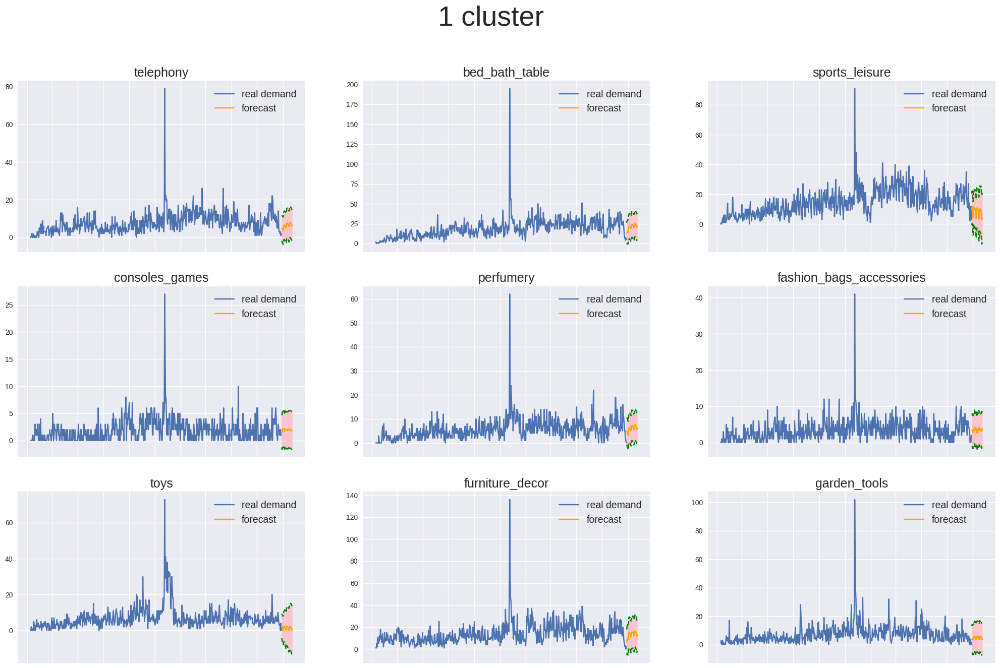

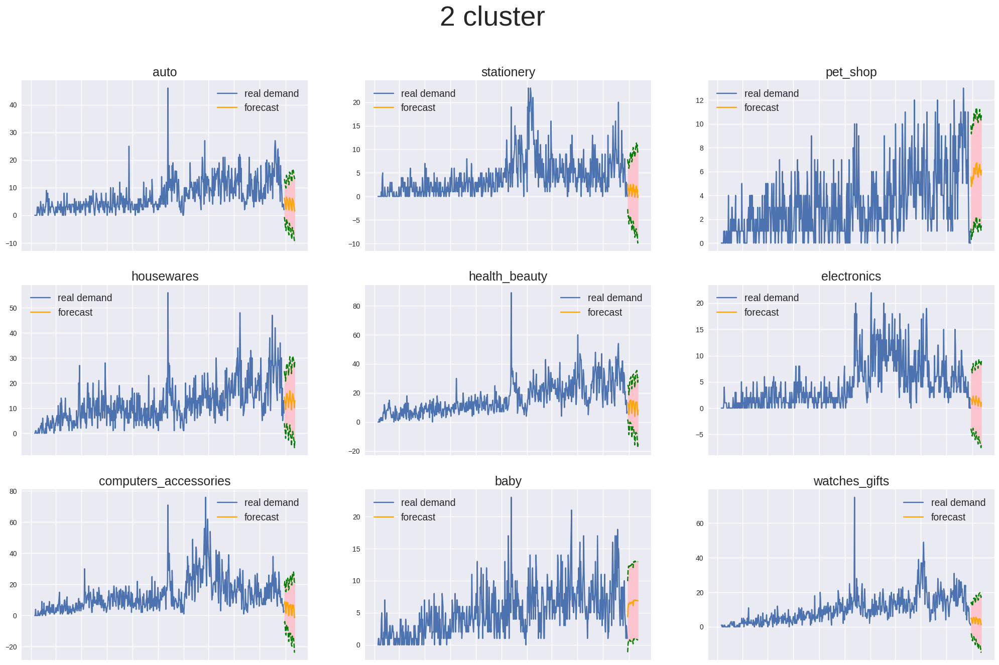

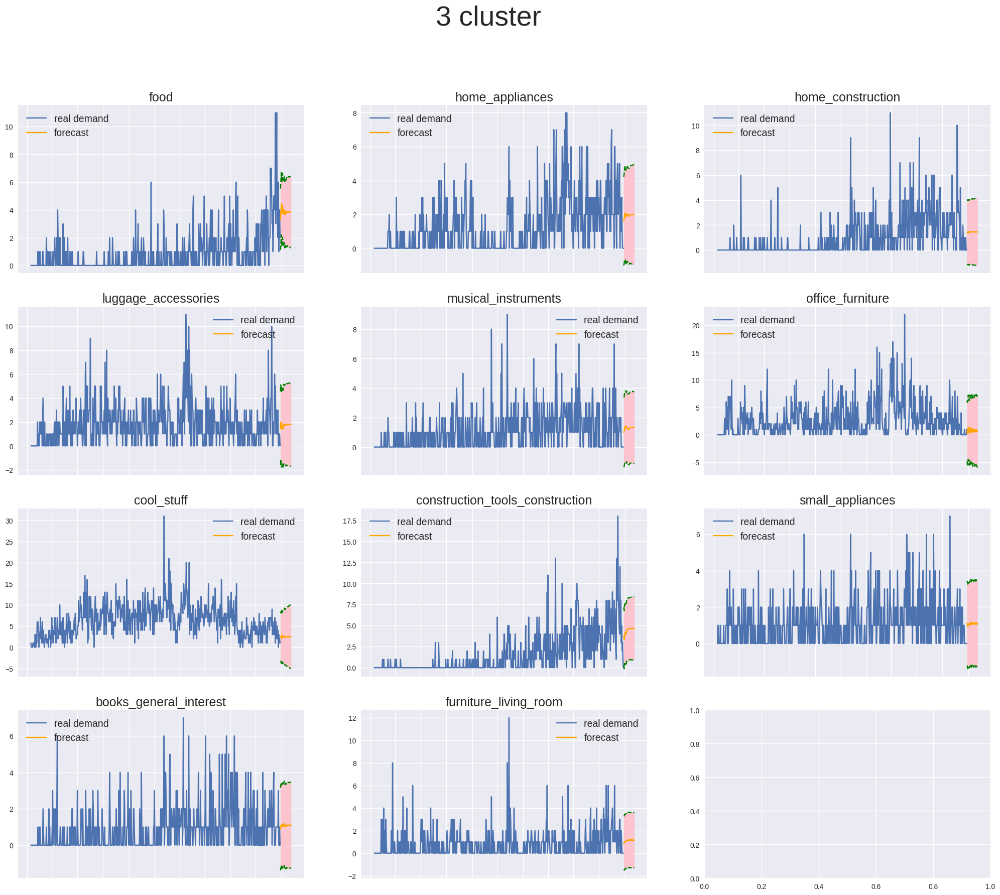

In [27]:
for cluster in np.unique(clusters):
    cluster_categories = cluster_df[cluster_df['Cluster'] == cluster]['Category'].to_list()
    page_l = ceil(len(cluster_categories) / 3)

    fig, axs = plt.subplots(page_l, 3, figsize=(25,page_l*5))
    fig.suptitle(f"{cluster} cluster", fontsize=40)
    for i in range(page_l):
        for j in range(3):
            if i*3+j >= len(cluster_categories):
                break
            # plotting real demand
            category = cluster_categories[j+3*i]
            category_series = category_data.loc[category]

            axs[i, j].plot(category_series.index, category_series.values, label='real demand')


            # making forecast
            future_exog = add_holiday(pd.DataFrame(columns=pd.date_range(start=category_series.index[-1], 
                                                                         periods=26 + 1, inclusive='right')))
            
            model = cluster_df[cluster_df['Category'] == category]['Model'].iloc[0]
            forecast = model.get_forecast(steps=26, exog=future_exog.transpose().loc[:,[*list(holidays.keys())]])
            pred_mean = forecast.predicted_mean
            conf_int = forecast.conf_int(alpha=0.05)


            # plotting forecast
            axs[i, j].plot(pred_mean.index, pred_mean.values, label='forecast', c='orange',)

            axs[i, j].plot(pred_mean.index, conf_int.iloc[:, 0], color='green', linestyle='--')
            axs[i, j].plot(pred_mean.index, conf_int.iloc[:, 1], color='green', linestyle='--')

            axs[i, j].fill_between(pred_mean.index, conf_int.iloc[:, 0], conf_int.iloc[:, 1], color='pink', alpha=0.9)

            axs[i, j].set_title(f'{category}', fontsize=18)
            axs[i, j].set_xticklabels([])
            axs[i, j].legend(fontsize=14)
    
    plt.show()

Тепер виведемо з меншим масштабом, де графік попиту зображений для останніх 100 днів.

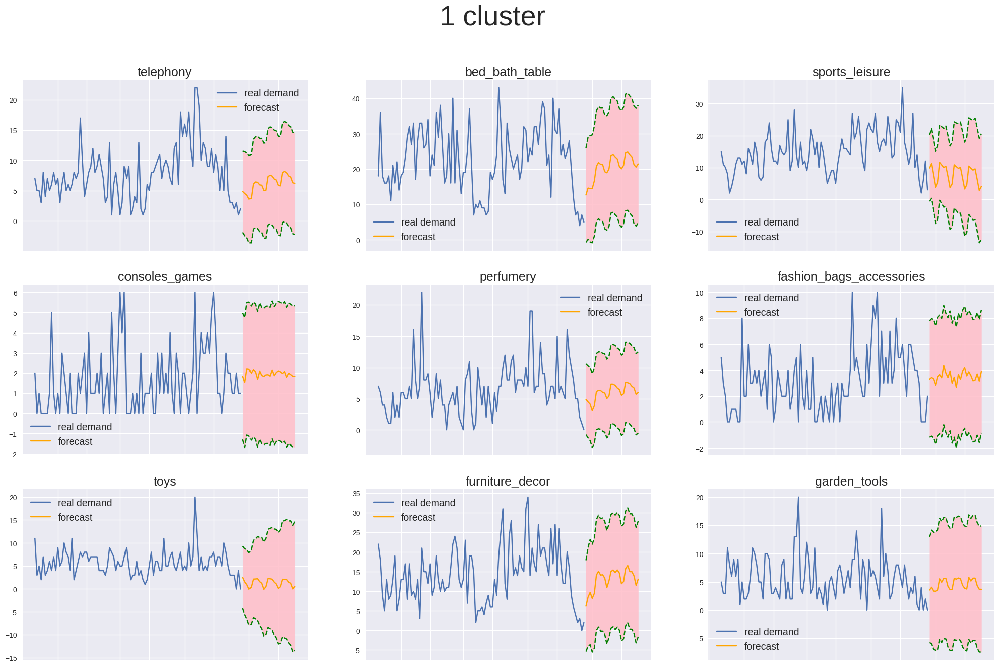

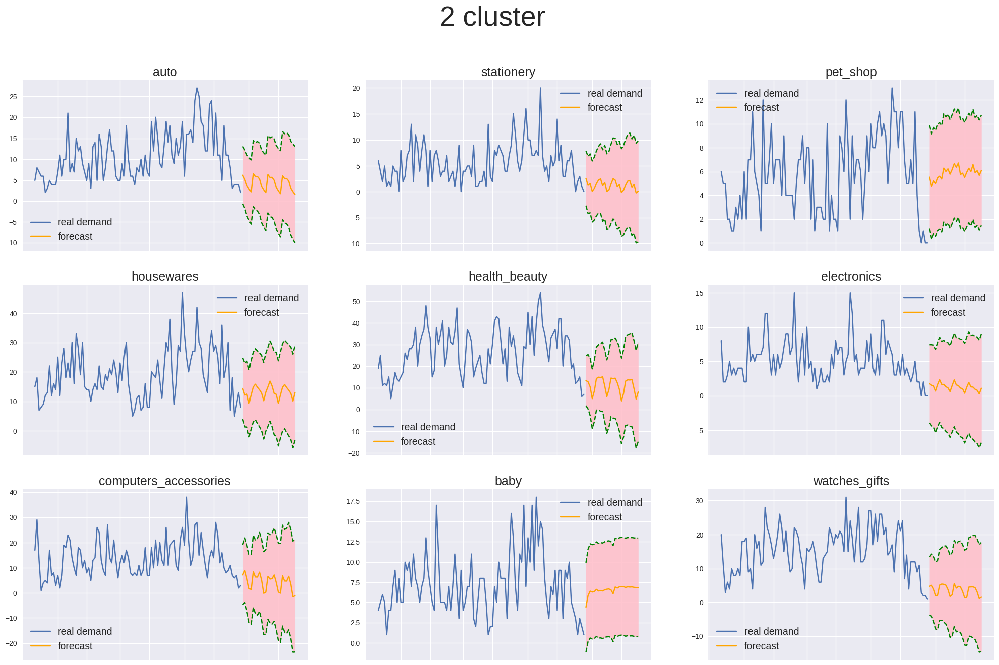

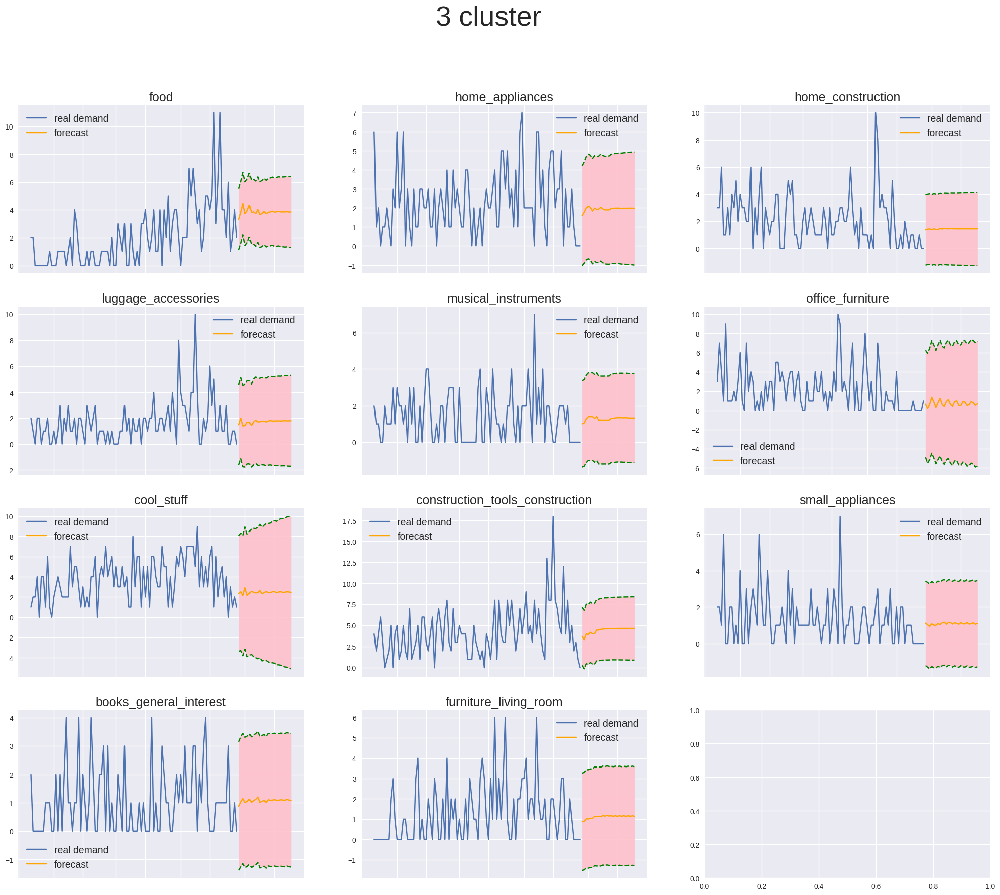

In [28]:
for cluster in np.unique(clusters):
    cluster_categories = cluster_df[cluster_df['Cluster'] == cluster]['Category'].to_list()
    page_l = ceil(len(cluster_categories) / 3)

    fig, axs = plt.subplots(page_l, 3, figsize=(25,page_l*5))
    fig.suptitle(f"{cluster} cluster", fontsize=40)
    for i in range(page_l):
        for j in range(3):
            if i*3+j >= len(cluster_categories):
                break
            # plotting real demand
            category = cluster_categories[j+3*i]
            category_series = category_data.loc[category]

            axs[i, j].plot(category_series.index[-100:], category_series.values[-100:], label='real demand')


            # making forecast
            future_exog = add_holiday(pd.DataFrame(columns=pd.date_range(start=category_series.index[-1], 
                                                                         periods=26 + 1, inclusive='right')))
            model = cluster_df[cluster_df['Category'] == category]['Model'].iloc[0]
            forecast = model.get_forecast(steps=26, exog=future_exog.transpose().loc[:,[*list(holidays.keys())]])
            pred_mean = forecast.predicted_mean
            conf_int = forecast.conf_int(alpha=0.05)


            # plotting forecast
            axs[i, j].plot(pred_mean.index, pred_mean.values, label='forecast', c='orange',)

            axs[i, j].plot(pred_mean.index, conf_int.iloc[:, 0], color='green', linestyle='--')
            axs[i, j].plot(pred_mean.index, conf_int.iloc[:, 1], color='green', linestyle='--')

            axs[i, j].fill_between(pred_mean.index, conf_int.iloc[:, 0], conf_int.iloc[:, 1], color='pink', alpha=0.9)

            axs[i, j].set_title(f'{category}', fontsize=18)
            axs[i, j].set_xticklabels([])
            axs[i, j].legend(fontsize=14)
    
    plt.show()

Прогнози виглядають природньо, лише для 3 кластеру все не так добре, бо прогноз для нього наче константа 
з шумом. Це сталося через те, що в 3 кластер попали ряди з невеликим попитом, багато значень в них
дорівнювали 0, тому вони опинилися в одному кластері. Для таких товарів можна провести більш тонкий аналіз - 
натренувати модель, або зробити як з іншими товарами з малим попитом - наблизити їх лінійною регресією.

Висновки: підхід з часовими рядами виявився непоганим, хоча, я думаю, авто-аріма для кожного ряду 
могла б дати кращі результати. Підхід з кластеризацію я виконав, щоб поексперементувати, бо він 
мені здався досить цікавим.

## Модель машинного навчання.

### 1. Для цього підходу я буду використовувати модель XGBoost.
Мій план побудувати глобальну модель для аналізу 71 ряду, яка буде враховувати
попит на категорії з певними лагами, середню оцінку категорії (це корисна фіча, бо відображає задоволеність 
клієнта товаром, що вплине на майбутній попит. Також можливість додавання таких фічей є перевагою 
перед класичним аналізом часових рядів); буде знаходити схожі паттерни в даних, 
що збільшить точність прогнозу. Для цих задач гарно підходить обрана модель, 
бо вона добре справляються з різнорідними ознаками і може враховувати складні взаємодії між ними.

In [29]:
# order id & timestamp & category

# we consider approved orders 
data = pd.merge(orders[orders['order_approved_at'].notna()], order_items, on='order_id', how='left')
data = pd.merge(data, products, on='product_id')
# we consider products with known category
data = pd.merge(data, product_category_name_translation, on='product_category_name')

data['order_purchase_timestamp'] = pd.to_datetime(data['order_purchase_timestamp'])


data = data[['order_id', 'order_purchase_timestamp', 
             'product_category_name_english', 'order_item_id']]

data = pd.merge(data, order_reviews[['order_id', 'review_score']], on='order_id')

data = data[(data['order_purchase_timestamp'] > '2017-01-10') & (data['order_purchase_timestamp'] <= '2018-08-29')]

In [30]:
daily_data = data.groupby(['product_category_name_english', pd.Grouper(key='order_purchase_timestamp', freq='D')]).\
    agg({
    'order_item_id': 'count',
    'review_score': 'mean',
    }).reset_index()

#### 1.1 Трохи підготуємо дані.
Я буду використовувати для навчання MLForecast через його зручність. Він очікує дані в певному форматі.
Щоб притримуватися цього формату, я маю створити для оцінок категорії нову категорію.

In [31]:
daily_data_with_revs = daily_data[['product_category_name_english', 'order_purchase_timestamp', 'order_item_id']]

# add the values of the review_score to the values of the series 
for category in data.product_category_name_english.unique():
    df2 = daily_data[daily_data['product_category_name_english']==category][['product_category_name_english', 'order_purchase_timestamp']].copy()
    df2['product_category_name_english'] = df2['product_category_name_english'].apply(lambda x: f'{x}_rev')
    df2['order_item_id'] = daily_data[daily_data['product_category_name_english']==category]['review_score']
    daily_data_with_revs = pd.concat([daily_data_with_revs, df2], ignore_index=True)

daily_data = daily_data_with_revs


In [32]:
# rename columns
daily_data.columns = ['unique_id', 'ds', 'y']


# preparing data for MLForecast
daily_data['unique_id'] = daily_data['unique_id'].astype('category')

Заповнимо нулями продажі категорій, якщо про них немає записів у цей день, а значення 
оцінок заповнимо середнім по категорії.

In [33]:
date_range = pd.date_range(start=daily_data['ds'].min(), end=daily_data['ds'].max())
categories = daily_data['unique_id'].unique()

# create a full index of all combinations of dates and categories
full_index = pd.MultiIndex.from_product([date_range, categories], names=['ds', 'unique_id'])
daily_data = daily_data.set_index(['ds', 'unique_id']).reindex(full_index, fill_value=0).reset_index()

In [34]:
means = daily_data[daily_data['unique_id'].str.endswith('_rev')].groupby('unique_id', observed=True)['y'].mean()

# create a function to replace zeros by category review averages
def replace_zeros(row):
    if row['y'] == 0 and row['unique_id'] in means.index:
        return means[row['unique_id']]
    return row['y']

daily_data['y'] = daily_data.apply(replace_zeros, axis=1)

Подивимось як виглядає датафрейм.

In [35]:
print(daily_data.head())
print(daily_data.columns)

          ds                   unique_id    y
0 2017-01-10  agro_industry_and_commerce  0.0
1 2017-01-10            air_conditioning  0.0
2 2017-01-10                         art  0.0
3 2017-01-10       arts_and_craftmanship  0.0
4 2017-01-10                       audio  0.0
Index(['ds', 'unique_id', 'y'], dtype='object')


Гарною ідеєю буде знову додати індикатори свят в датафрейм. Працювати з ними наша модель буде, як з зовнішніми змінними.

In [36]:
import holidays_mlf
daily_data = holidays_mlf.add_holiday(daily_data)

### 2. Feature selection.
Щоб модель краще працювала, в неї треба додати правильні фічі, я додав лаги кратні тижневим, скористався вбудованими фічами 
пов'язаними з днем тижня та місяцем, ще для кожного дня розраховано середнє, максимальне і мінімальне значення за попередні 7 днів, ґрунтуючись на значеннях з лагом 1. Всі ці фічі мають в цілому покращити перформанс моделі.

Підбирати найкращу модель по якості її прогнозу сенсу особливого немає, бо ряди достатньо важко влаштовані, тому будемо вчити одразу 
на всій вибірці.

In [37]:
from xgboost import XGBRegressor
from mlforecast import MLForecast
from window_ops.rolling import rolling_mean, rolling_max, rolling_min
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8')



models = [XGBRegressor(random_state=0, n_estimators=100)]
model = MLForecast(
    models=models,
    freq='D',
    lags=[1, 7, 14, 21, 26], 
    date_features=['dayofweek', 'month'],
    num_threads=6,
    lag_transforms={
                       1: [(rolling_mean, 7), (rolling_max, 7), (rolling_min, 7)],
                   },
)
model.fit(daily_data, id_col='unique_id', time_col='ds', target_col='y', static_features=[])

MLForecast(models=[XGBRegressor], freq=D, lag_features=['lag1', 'lag7', 'lag14', 'lag21', 'lag26', 'rolling_mean_lag1_window_size7', 'rolling_max_lag1_window_size7', 'rolling_min_lag1_window_size7'], date_features=['dayofweek', 'month'], num_threads=6)

Зробимо датафрейм зі святами, які нам знадобляться для прогнозування.

In [38]:
future = pd.DataFrame({'ds': pd.date_range(start=daily_data['ds'].iloc[-1], periods=27, freq='D', inclusive='right')})
categories = pd.DataFrame({'unique_id':daily_data['unique_id'].unique()})
future = pd.merge(future.assign(key=1), categories.assign(key=1), on='key').drop('key', axis=1)

future_df = holidays_mlf.add_holiday(future).sort_values(['unique_id', 'ds'])

Тепер зробимо прогнозування.

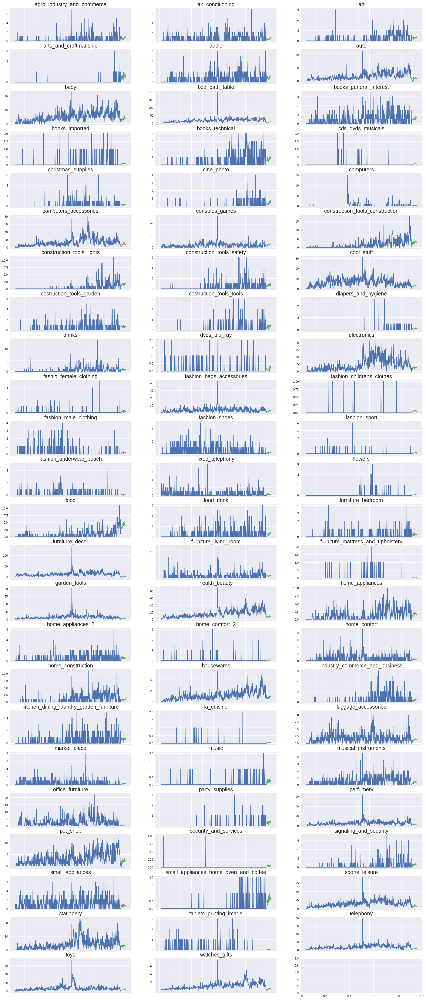

<Figure size 800x550 with 0 Axes>

In [39]:
forecast = model.predict(h=26, X_df=future_df)


categories = daily_data[~daily_data['unique_id'].str.endswith('_rev')]['unique_id'].unique()
fig, axs = plt.subplots(24,3,figsize=(25,60))
for i in range(24):
    for j in range(3):
        if i*3+j+1>len(categories):
            break
        category = categories[3*i+j]
        category_forecast = forecast[forecast['unique_id'] == category]
        category_data = daily_data[daily_data['unique_id'] == category]

        axs[i, j].plot(category_data['ds'], category_data['y'], label='Фактические данные')
        axs[i, j].plot(category_forecast['ds'], category_forecast['XGBRegressor'], label='Прогноз')
        axs[i, j].set_title(category, fontsize=18)
        axs[i, j].set_xticklabels([])
        
plt.show()
plt.tight_layout()
plt.show()

Менший масштаб.

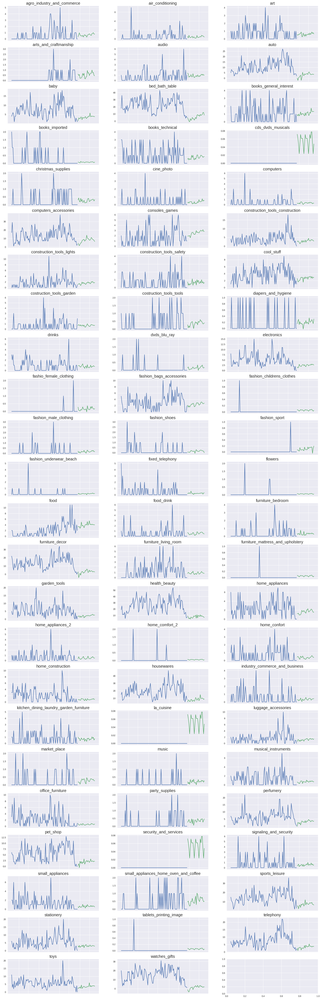

<Figure size 800x550 with 0 Axes>

In [40]:
categories = daily_data[~daily_data['unique_id'].str.endswith('_rev')]['unique_id'].unique()
fig, axs = plt.subplots(24,3,figsize=(25,80))
for i in range(24):
    for j in range(3):
        if i*3+j+1>len(categories):
            break
        category = categories[3*i+j]
        category_forecast = forecast[forecast['unique_id'] == category]
        category_data = daily_data[daily_data['unique_id'] == category]

        axs[i, j].plot(category_data['ds'][-100:], category_data['y'][-100:], label='Фактические данные')
        axs[i, j].plot(category_forecast['ds'], category_forecast['XGBRegressor'], label='Прогноз')
        axs[i, j].set_title(category, fontsize=18)
        axs[i, j].set_xticklabels([])
        
plt.show()
plt.tight_layout()
plt.show()

Бачимо, що прогнози виглядають досить природньо, я вважаю результат задовільним.